# **Inference**

In [1]:
# For CPU:
!pip install -qqq paddleocr==3.2.0 paddlepaddle==3.0.0 python-Levenshtein

# For GPU:
# !pip install -q paddlepaddle-gpu==3.0.0 -i https://www.paddlepaddle.org.cn/packages/stable/cu126/
# !pip install -qqq paddleocr==3.2.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.5/80.5 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.3/43.3 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.0/76.0 kB 1.8 MB/s eta 0:00:00eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 192.8/192.8 MB 9.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.5/65.5 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 153.6/153.6 kB 8.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 52.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 763.0/763.0 kB 31.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.7/68.7 MB 26.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.0/63.0 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.1/6.1 MB 102.0 MB/s eta 0:00:0000:01
   ━━━━━━━━━━

In [2]:
from paddleocr import PaddleOCR, TextRecognition 
import yaml
import os
import shutil
from PIL import Image
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm
import Levenshtein
import statistics

In [3]:
import paddle
paddle.is_compiled_with_cuda()

/usr/local/lib/python3.11/dist-packages/paddle/utils/cpp_extension/extension_utils.py:711: UserWarning: No ccache found. Please be aware that recompiling all source files may be required. You can download and install ccache from: https://github.com/ccache/ccache/blob/master/doc/INSTALL.md
  warnings.warn(warning_message)


False

In [9]:
dst_dir = '/kaggle/working/v3'
os.makedirs(dst_dir, exist_ok=True)

src = '/kaggle/input/v3-recmerge-ep40-char25-evaltest/other/default/1'
shutil.copytree(src, dst_dir, dirs_exist_ok=True)

'/kaggle/working/v3'

In [10]:
dst_dir = '/kaggle/working/v5'
os.makedirs(dst_dir, exist_ok=True)

src = '/kaggle/input/v5-recmerge-ep40-char40-evaltest/other/default/1'
shutil.copytree(src, dst_dir, dirs_exist_ok=True)

'/kaggle/working/v5'

In [6]:
def create_model(height, model_dir):
    assert height==32 or height==48 or height==64, "`height` must be in one of three choices: 32, 48, or 64"
    yml_path = os.path.join(model_dir, 'inference.yml')
    
    with open(yml_path, 'r') as file:
            infer_yml = yaml.safe_load(file)
            infer_yml['PreProcess']['transform_ops'][2]['RecResizeImg']['image_shape'] = [3, height, 320]
    with open(yml_path, 'w') as file:
        yaml.dump(infer_yml, file)

    model = PaddleOCR(
        use_textline_orientation=False,
        use_doc_orientation_classify=False,
        use_doc_unwarping=False,
        text_detection_model_name='PP-OCRv5_mobile_det',
        text_recognition_model_name="PP-OCRv5_mobile_rec",
        text_recognition_model_dir=model_dir,
    )

    return model

In [7]:
def pipeline(model, img_path):   
    result = model.predict(img_path)
    print(result[0]['rec_texts'])
    
    img = cv2.imread(img_path)
    dt_polys = result[0]['dt_polys']
    
    for poly in dt_polys:
        pts = poly.astype(np.int32)
        cv2.polylines(img, [pts], isClosed=True, color=(255, 0, 0), thickness=1)
    
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

In [8]:
_MODEL_c25_h32 = create_model(height=32, model_dir='/kaggle/working/v3/infer')
_MODEL_c25_h48 = create_model(height=48, model_dir='/kaggle/working/v3/infer')
_MODEL_c25_h64 = create_model(height=64, model_dir='/kaggle/working/v3/infer')

_MODEL_c40_h32 = create_model(height=32, model_dir='/kaggle/working/v5/infer')
_MODEL_c40_h48 = create_model(height=48, model_dir='/kaggle/working/v5/infer')
_MODEL_c40_h64 = create_model(height=64, model_dir='/kaggle/working/v5/infer')

Creating model: ('PP-OCRv5_mobile_det', None)
Using official model (PP-OCRv5_mobile_det), the model files will be automatically downloaded and saved in `/root/.paddlex/official_models/PP-OCRv5_mobile_det`.


Fetching 6 files:   0%|          | 0/6 [00:00<?, ?it/s]

inference.yml:   0%|          | 0.00/903 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

inference.json: 0.00B [00:00, ?B/s]

config.json: 0.00B [00:00, ?B/s]

.gitattributes: 0.00B [00:00, ?B/s]

inference.pdiparams:   0%|          | 0.00/4.69M [00:00<?, ?B/s]

Creating model: ('PP-OCRv5_mobile_rec', '/kaggle/working/v3/infer')
Creating model: ('PP-OCRv5_mobile_det', None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `/root/.paddlex/official_models/PP-OCRv5_mobile_det`.
Creating model: ('PP-OCRv5_mobile_rec', '/kaggle/working/v3/infer')
Creating model: ('PP-OCRv5_mobile_det', None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `/root/.paddlex/official_models/PP-OCRv5_mobile_det`.
Creating model: ('PP-OCRv5_mobile_rec', '/kaggle/working/v3/infer')
Creating model: ('PP-OCRv5_mobile_det', None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `/root/.paddlex/official_models/PP-OCRv5_mobile_det`.
Creating model: ('PP-OCRv5_mobile_rec', '/kaggle/working/v5/infer')
Creating model: ('PP-OCRv5_mobile_det', None)
Model files already exist. Using cached files. To redownload, please delete the di

In [9]:
!wget -O img_test.jpg https://hanoiadv.com/wp-content/uploads/2025/02/bien-tap-hoa-4.jpg

--2025-12-25 03:45:05--  https://hanoiadv.com/wp-content/uploads/2025/02/bien-tap-hoa-4.jpg
Resolving hanoiadv.com (hanoiadv.com)... 45.252.251.52
Connecting to hanoiadv.com (hanoiadv.com)|45.252.251.52|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 78829 (77K) [image/jpeg]
Saving to: ‘img_test.jpg’

img_test.jpg        100%[===================>]  76.98K   181KB/s    in 0.4s    

2025-12-25 03:45:07 (181 KB/s) - ‘img_test.jpg’ saved [78829/78829]



['HANOIADV', 'HÀNG TẠP HOA', 'CỬA', 'PHƯƠNG', 'TUẤN', 'Lô 7 Chợ Hoà Cường Bắc, Hải Châu, TP Đà Nẵng - ĐT: 0 1683 840 271']


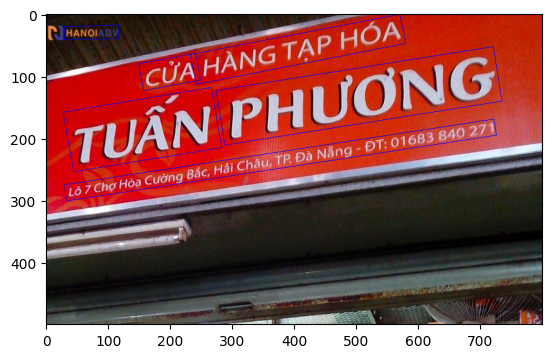

['HANOIADV', 'HÀNG TẠP HOA', 'CỬA', 'PHƯƠNG', 'TUẤN', 'Lô 7 Chợ Hòả Cường Bắc, Hãi Châu, TP. Đà Nẵng ĐT: 01683 840 271']


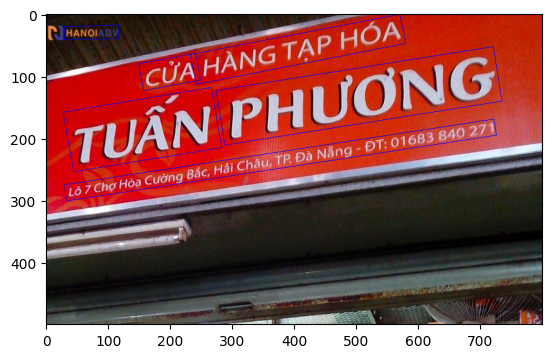

In [10]:
pipeline(_MODEL_c25_h32, '/kaggle/working/img_test.jpg')
pipeline(_MODEL_c40_h32, '/kaggle/working/img_test.jpg')

['HANOIADV', 'HÀNG TẠP HÓA', 'CỬA', 'PHƯƠNG', 'TUẤN', 'Lô 7 Chợ Hòà Cường Bắc, Hải Châu, TP Đà Nẵng - ĐT: 01 683 840 271']


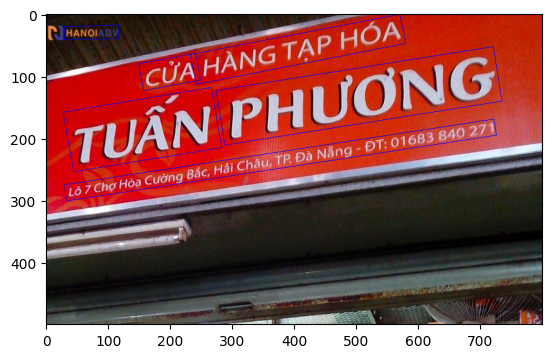

['HANOIADV', 'HÀNG TẠP HOA', 'CỬA', 'PHƯƠNG', 'TUẤN', 'Lô 7 Chợ Hòà Cường Bắc, Hải Châu, TP. Đà Nẵng - ĐT: 01683 84O 271']


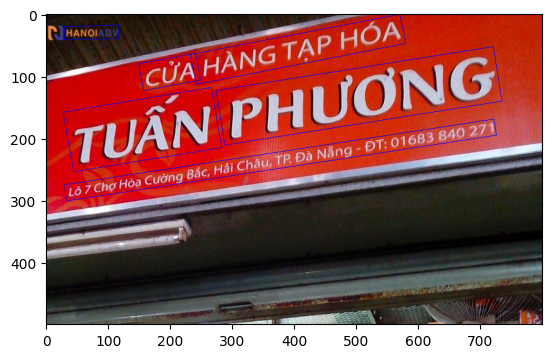

In [11]:
pipeline(_MODEL_c25_h48, '/kaggle/working/img_test.jpg')
pipeline(_MODEL_c40_h48, '/kaggle/working/img_test.jpg')

['HANOIADY', 'HÀNG TẠP HÓA', 'CỬA', 'PHƯƠNG', 'TUẤN', 'Lô 7 Chợ Hòa Cường Bắc, Hải Châu, TP. Đà Nẵng ĐT: 01 683 840 271']


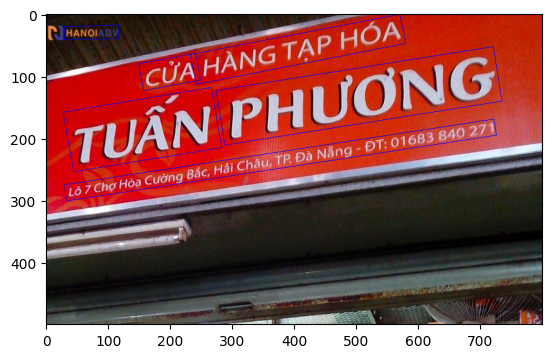

['HANOIADV', 'HÀNG TẠP HOA', 'CỬA', 'PHƯƠNG', 'TUẤN', 'Lô 7 Chợ Hòả Cường Bắc, Hải Châu, TP Đà Nẵng - ĐT: 01 683 840 27 1']


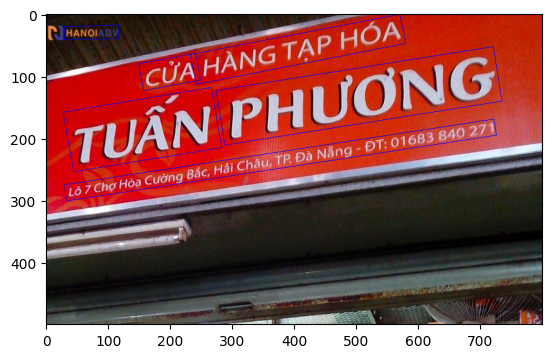

In [12]:
pipeline(_MODEL_c25_h64, '/kaggle/working/img_test.jpg')
pipeline(_MODEL_c40_h64, '/kaggle/working/img_test.jpg')

In [13]:
!wget -O img_test.jpg https://aloprint.vn/wp-content/uploads/2023/06/Bandroll-cua-hang-dien-thoai.jpg

--2025-12-25 03:47:33--  https://aloprint.vn/wp-content/uploads/2023/06/Bandroll-cua-hang-dien-thoai.jpg
Resolving aloprint.vn (aloprint.vn)... 103.82.38.163
Connecting to aloprint.vn (aloprint.vn)|103.82.38.163|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 82534 (81K) [image/jpeg]
Saving to: ‘img_test.jpg’

img_test.jpg        100%[===================>]  80.60K   368KB/s    in 0.2s    

2025-12-25 03:47:34 (368 KB/s) - ‘img_test.jpg’ saved [82534/82534]



['ALOPBHT', 'cellphane S', 'MÁY TỈNH', 'Giảm đến', '25%', 'CHI NHÁNH ĐỒNG NAI', 'đaxd', 'CÔNG TY TNHH ĐỒNG THÚ', 'ÁN SỈ & LỄ', 'I TA - Ả TRE', ': 2513.6677', 'ĐA CHỈ S1 THÍCH QUẢNG ĐUỨC NỐI PI KHU PHỐS, PHƯỜNG XUÂNAN, THÀNHPHỐ LONG', 'Điện thoại: 0251366.777', 'THIẾN - VIT', 'Đạt Hàng Thra Yêu câ', 'Đ1: 0973.55.954', '175 HÙNG VƯƠNG', 'LONG KHÁNH']


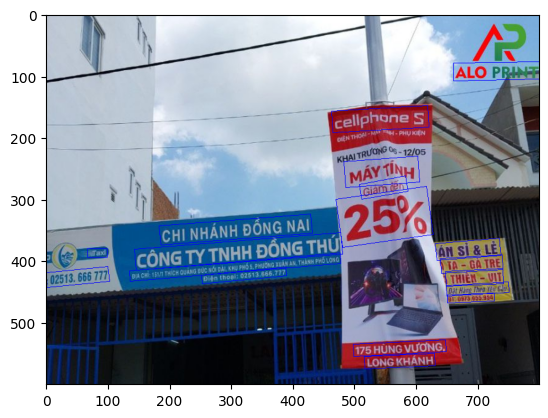

['ALOPBHNH', 'celphone S', 'MÁY TÍNH', 'Giảm iến', '25h', 'CHI NHÁNH ĐỒNG NAI', 'Taxd', 'CÔNG TY TNHH ĐỒNG THÚ', 'ÁN SỈ & LẺ', 'I TA - GÀ TRE', ': 2513.66677', 'ĐIA CHỈ: 51 THÍC QUNG DC ỐI ÀL, KH PH , PHƯỜNG XUÂN A.THÀNH PHỐ LONG', 'Điện thoại: 02513 66.777', 'THIẾN VỊT', 'Địt Hàng Thea Yru 3ảy', 'ĐT: 0973.65.954', '175 HÙNG VƯƠNG', 'LONG KHÁNH']


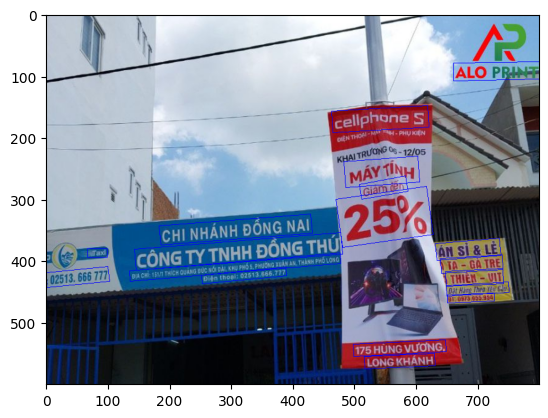

In [14]:
pipeline(_MODEL_c25_h32, '/kaggle/working/img_test.jpg')
pipeline(_MODEL_c40_h32, '/kaggle/working/img_test.jpg')

['ALO PRINT', 'cellphone S', 'MÁY TÍNH', 'Giảm tến', '25%', 'CHI NHÁNH ĐỒNG NAI', 'Taxdl', 'CÔNG TY TNHH ĐỒNG THÚ', 'ÁN SỈ & LẺ', 'TA GÀ TRE', ': 02513.666777', 'ĐỊA CHỈ: 151/T THÍCH QUẢNG ĐỨC NỐI ĐÀI, KHU PHỐ 5, PHƯỜNG XUÂN AN, THÀNH PHỐ LONG', 'Điện thoại: 02513.666.777', 'THIẾN - VỊT', 'Đạt Hàng Thea Yêu 6ây', 'Đ: 0973.055.954', '175 HÙNG VƯƠNG,', 'LONG KHÁNH']


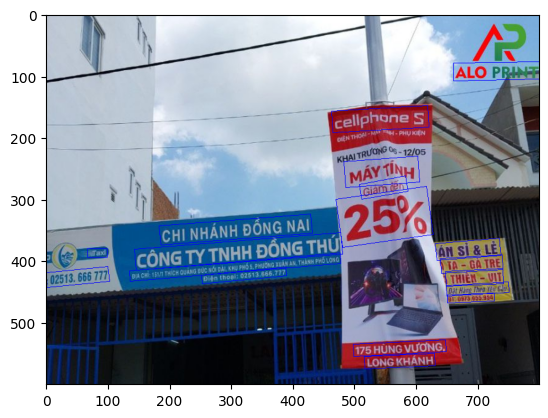

['ALO PRINT', 'cellphone S', 'MÁY TÍNH', 'Giảm iến', '25%', 'CHI NHÁNH ĐỒNG NAI', 'axdl', 'CÔNG TY TNHH ĐỒNG THÚ', 'ÁN SỈ & LẺ', ' TA - GÀ TRE', ': 02513.666777', 'ĐỊA CHỈ: 151/T THÍCH CUẢNG ĐỨC NỐI DÀI, KHU PHỐ 5, PHƯỜNG XUÂN AN, THÀNH PHỐ LONG', 'Điện thoại: 02513.666.777', 'THIẾN VỊT', 'Đật Hàng Thea Yêu Gâu', 'Đ: 0973.055.954', '175 HÙNG VƯƠNG,', 'LONG KHÁNH']


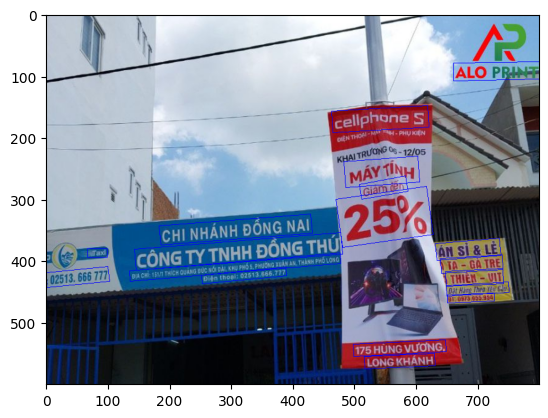

In [15]:
pipeline(_MODEL_c25_h48, '/kaggle/working/img_test.jpg')
pipeline(_MODEL_c40_h48, '/kaggle/working/img_test.jpg')

['ALO PRHNH', 'cellphone S', 'MÁY TÍNH', 'Giảm đến', '25%', 'CHI NHÁNH ĐỒNG NAI', 'Taxd', 'CÔNG TY TNHH ĐỒNG THÚ', 'ÁN SỈ & LẺ', 'TA GÀ TRE', ': 02513. 666 777', 'ĐỊA CHỈ: 151 /1 THÍCH QUẢNG ĐỨC NỒI DÀI, KHU PHỐ S, PHƯỜNG XUÂN AN, THÀNH PHỐ LONG', 'Điện thoại: 02513.666.777', 'THIẾN - VỊT', 'Đạt Hàng Thẹg Yêu 6ây', 'Đ1: 0973.655.954', '175 HÙNG VƯƠNG,', 'LONG KHÁNH']


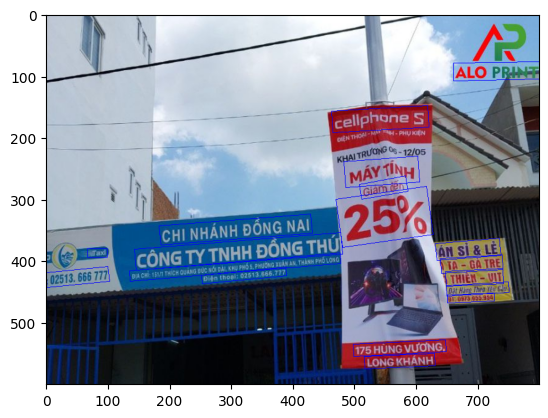

['ALO PRHNH', 'cellphone s', 'MÁY TÍNH', 'Giảm đến', '25%', 'CHI NHÁNH ĐỒNG NAI', 'Taxl', 'CÔNG TY TNHH ĐỒNG THÚ', 'ÁN SỈ & LẺ', 'Q TA - GÀ TRE', ': 02513. 666 777', 'ĐỊA CHỈ: 151/1 THÍCH QUẢNG ĐỨC NỐI DÀI, KHU PHỐ 5, PHƯỜNG XUÂN AN, THÀNH PHỐ LONG', 'Điện thoại: 02513 666.777', 'THIẾN - VỊT', 'Đật Hàng Theg Yêu Gây', 'Đ1: 0973.005.954', '175 HÙNG VƯƠNG,', 'LONG KHÁNH']


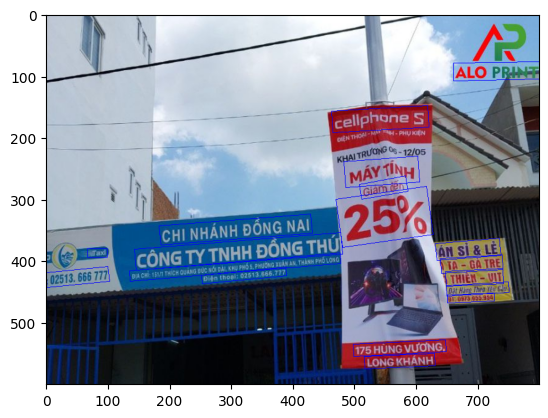

In [16]:
pipeline(_MODEL_c25_h64, '/kaggle/working/img_test.jpg')
pipeline(_MODEL_c40_h64, '/kaggle/working/img_test.jpg')

In [17]:
!wget -O img_test.jpg https://quangcaogiarehcm.vn/uploads/images/menuq8/in-menu-quan-8-2.jpg

--2025-12-25 03:49:47--  https://quangcaogiarehcm.vn/uploads/images/menuq8/in-menu-quan-8-2.jpg
Resolving quangcaogiarehcm.vn (quangcaogiarehcm.vn)... 103.77.162.43
Connecting to quangcaogiarehcm.vn (quangcaogiarehcm.vn)|103.77.162.43|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 175707 (172K) [image/jpeg]
Saving to: ‘img_test.jpg’

img_test.jpg        100%[===================>] 171.59K   226KB/s    in 0.8s    

2025-12-25 03:49:49 (226 KB/s) - ‘img_test.jpg’ saved [175707/175707]



["89'C Cafe", 'Ăn Vặt Trà Sữa', 'Coffee', 'Đá Xay', 'Cafe đen / sữa', '10k', 'Matcha đá xay', 'Cafe đen / sữa sải gòn', '20k', '15k', 'Chanh tuyết', 'Espresso', '20Kk', '25k', 'Cam tuyết', 'Cacao nóng', '20k', '10k', 'Cacao đá', 'Bạc xiu nóng', '18k', 'Mojito - Soda', '15k', 'Bạc xiu đá', '20k', 'Mojitođào', '18k', 'Đặc biệt cafe cốt dừa', '25k', 'Moito việt quất', '18K', 'Soda việt quất', 'Soda ble', 'HA', '18K', 'Trà', '18k', 'Trà lipton nóng', '20k', 'Sinh Tố', 'Trà lipton đá', '25k', 'Trà gừng', 'Sinh tố bơ (theo mùa)', '15k', 'Sinh tố cam + đào', '20k', 'Trà đào', '18k', '25k', 'Trà đào cam sả', 'Sinh tố xoài', '20k', '20k', 'Yaourt', 'Nước Ếp', 'Yaourt đá', 'Yaourt trái cây', '15k', 'Cam vắt', '20k', 'Cà rốt', '20K', 'Yaourt cam + đào', '20k', '15k', 'Dưa hẩu', '15k', 'Cà chua', 'Thơm', '15k', 'Thuốc lá', '', 'cóc', 'Các loại nước có sẫn', 'bi', 'Chanh dây', '15k']


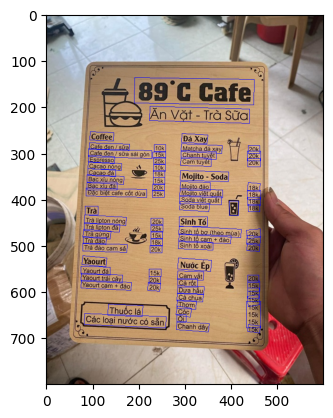

['89 C Cafe', 'Ăn Vặt Trà Sữa', 'Coffee', 'Đá Xay', 'Cafe đen /sữa', '10K', 'Matcha đá xay', 'Cafe đen / sữa sải gòn', '20k', '15k', 'Chanh tuyết', 'Espresso', '20K', '25k', 'Cam tuyết', 'Cacao nóng', '20k', '10k', 'Cacao đá', 'Bạc xiu nóng', '18k', 'Mojito - Soda', '15k', 'Bạc xiu đá', '20K', 'Mojito đào', '18k', 'Đặc biệt cafe cốt dừa', '25k', 'Moito việt quất', '18k', 'Soda việt quất', 'Soda blue', 'D', '18k', 'Trà', '18k', 'Trà lipton nóng', '20K', 'Sinh Tố', 'Trà ipton đá', '25k', 'Trà gừng', 'Sinh tổ bơ (theo mủa)', '15k', 'Sinh tố cam + đào', '20K', 'Trà đào', '18k', '25K', 'Trà đào cam sả', 'Sinh tổ xoài', '20k', '20K', 'Yaourt', 'Nước Ép', 'Yaourt đá', 'Yaourt rái cây', '15k', 'Cam vắt', '20k', 'Cà rốt', '20k', 'Yaourt cam + đào', '20K', '15K', 'Dưa hấu', '15K', 'Cà chua', 'Thơm', '15k', 'Thuốc lá', 'Ặ', 'cóc', 'Các loại nước có sẵn', 'Ôi', 'Chanh dây', '15k']


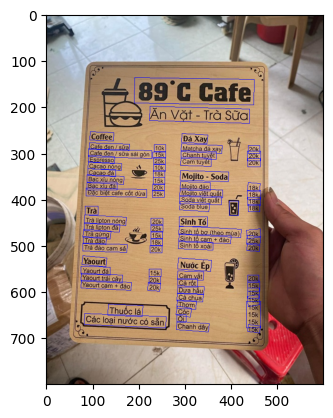

In [18]:
pipeline(_MODEL_c25_h32, '/kaggle/working/img_test.jpg')
pipeline(_MODEL_c40_h32, '/kaggle/working/img_test.jpg')

["89'C Cafe", 'Ăn Vặt - Trà Sữa', 'Coffee', 'Đá Xay', 'Cafe đen / sữa', '10K', 'Matcha đá xay', 'Cafe đen / sữa sài gòn', '20k', '15k', 'Chanh tuyết', 'Espresso', '20Kk', '25k', 'Cam tuyết', 'Cacao nóng', '20k', '10k', 'Cacao đá', 'Bạc xiu nóng', '18k', 'Mojito Soda', '15k', 'Bạc xiu đá', '20K', 'Mojito đào', '18k', 'Đặc biệt cafe cốt dừa', '25k', 'Mojito việt quất', '18K', 'Soda việt quất', 'Soda blue', '', '18K', 'Trà', '18k', 'Trà lipton nóng', '20k', 'Sinh Tố', 'Trà lipton đá', '25k', 'Trà gừng', 'Sinh tố bơ (theo mùa)', '15k', 'Sinh tố cam + đào', '20k', 'Trà đào', '18k', '25K', 'Trà đào cam sả', 'Sinh tố xoài', '20K', '20K', 'Yaourt', 'Nước Ép', 'Yaourt đá', 'Yaourt trái cây', '15k', 'Cam vắt', '20k', 'Cà rốt', '20k', 'Yaourt cam + đào', '20k', '15k', 'Dưa hấu', '15k', 'Cà chua', 'Thơm', '15k', 'Thuốc lá', 'H', 'Cóc', 'Các loại nước có sẵn', 'Ôi', 'Chanh dây', '15k']


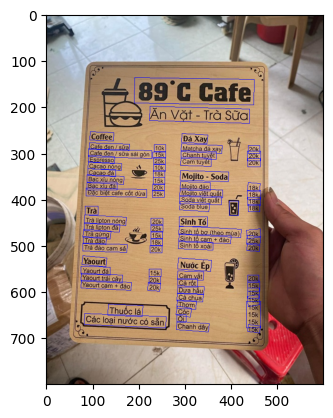

['89C Cafe', 'Ăn Vặt Trà Sữa', 'Coffee', 'Đá Xay', 'Cafe đen / sữa', '10k', 'Matcha đá xay', 'Cafe đen / sữa sài gòn', '20k', '15k', 'Chanh tuyết', 'Espresso', '20k', '25k', 'Cam tuyết', 'Cacao nóng', '20k', '10k', 'Cacao đá', 'Bạc xĩu nóng', '18k', 'Mojito Soda', '15k', 'Bạc xiu đá', '20k', 'Mojito đào', '18k', 'Đặc biệt cafe cốt dừa', '25k', 'Mojito việt quất', '18K', 'Soda việt quất', 'Soda blue', 'B', '18K', 'Trà', '18k', 'Trà lipton nóng', '20k', 'Sinh Tố', 'Trà lipton đá', '25k', 'Trà gừng', 'Sinh tố bơ (theo mùa)', '15k', 'Sinh tố cam + đào', '20K', 'Trà đào', '18k', '25k', 'Trà đào cam sả', 'Sinh tố xoài', '20k', '20k', 'Yaourt', 'Nước Ép', 'Yaourt đá', 'Yaourt trái cây', '15k', 'Cam vắt', '20k', 'Cà rốt', '20k', 'Yaourt cam + đào', '20k', '15k', 'Dưa hấu', '15k', 'Cà chua', 'Thơm', '15k', 'Thuốc lá', 'N', 'cóc', 'Các loại nước có sẵn', 'Ôi', 'Chanh dây', '15k']


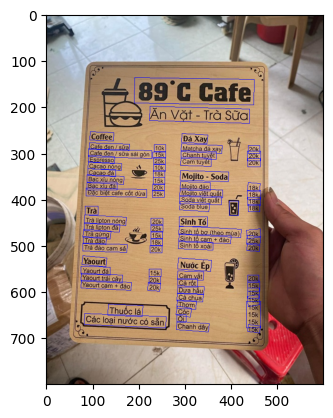

In [19]:
pipeline(_MODEL_c25_h48, '/kaggle/working/img_test.jpg')
pipeline(_MODEL_c40_h48, '/kaggle/working/img_test.jpg')

["89'C Cafe", 'Ăn Vặt Trà Sữa', 'Coffee', 'Đá Xay', 'Cafe đen / sữa', '10k', 'Matcha đá xay', 'Cafe đen / sữa sài gòn', '20k', '15k', 'Chanh tuyết', 'Espresso', '20K', '25k', 'Cam tuyết', 'Cacao nóng', '20k', '10k', 'Cacao đá', 'Bạc xiu nóng', '18k', 'Mojito - Soda', '15k', 'Bạc xiu đá', '20k', 'Mojito đào', '18k', 'Đặc biệt cafe cốt dừa', '25k', 'Mojito việt quất', '18k', 'Soda việt quất', 'Soda blue', 'B', '18K', 'Trà', '18k', 'Trà lipton nóng', '20k', 'Sinh Tố', 'Trà lipton đá', '25k', 'Trà gừng', 'Sinh tố bơ (theo mùa)', '15k', 'Sinh tố cam + đào', '20K', 'Trà đào', '18k', '25K', 'Trà đào cam sả', 'Sinh tố xoài', '20k', '20K', 'Yaourt', 'Nước Ép', 'Yaourt đá', 'Yaourt trái cây', '15k', 'Cam vắt', '20k', 'Cà rốt', '20k', 'Yaourt cam + đào', '20k', '15k', 'Dưa hấu', '15k', 'Cà chua', 'Thơm', '15k', 'Thuốc lá', 'Hắh', 'Cóc', 'Các loại nước có sẵn', 'Ổi', 'Chanh dây', '15k']


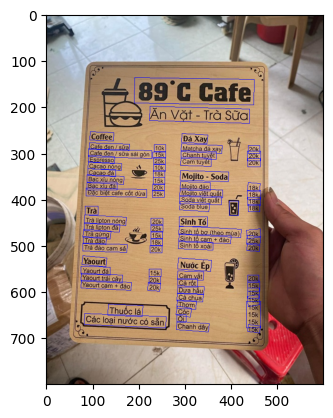

['89:C Cafe', 'Ăn Vặt Trà Sữa', 'Coffee', 'Đá Xay', 'Cafe đen / sữa', '10k', 'Matcha đá xay', 'Cafe đen / sữa sài gòn', '20k', '15k', 'Chanh tuyết', 'Espresso', '20K', '25k', 'Cam tuyết', 'Cacao nóng', '20k', '10k', 'Cacao đá', 'Bạc xiu nóng', '18k', 'Mojito - Soda', '15k', 'Bạc xiu đá', '20k', 'Mojito đào', '18k', 'Đặc biệt cafe cốt dừa', '25k', 'Mojito việt quất', '18K', 'Soda việt quất', 'Soda blue', 'ĐO', '18k', 'Trà', '18k', 'Trà lipton nóng', '20k', 'Sinh Tố', 'Trà lipton đá', '25k', 'Trà gừng', 'Sinh tố bơ (theo mùa)', '15k', 'Sinh tố cam + đào', '20k', 'Trà đào', '18k', '25k', 'Trà đào cam sả', 'Sinh tố xoài', '20k', '20k', 'Yaourt', 'Nước Ép', 'Yaourt đá', 'Yaourt trái cây', '15k', 'Cam vắt', '20k', 'Cả rốt', '20k', 'Yaourt cam + đào', '20k', '15k', 'Dưa hấu', '15k', 'Cà chua', 'Thơm', '15k', 'Thuốc lá', 'ắ', 'cóc', 'Các loại nước có sẵn', 'Ổi', 'Chanh dây', '15k']


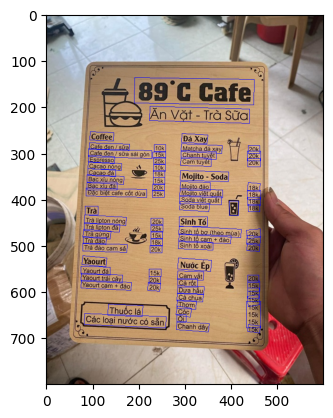

In [20]:
pipeline(_MODEL_c25_h64, '/kaggle/working/img_test.jpg')
pipeline(_MODEL_c40_h64, '/kaggle/working/img_test.jpg')

In [21]:
!wget -O img_test.jpg https://thiepcuoicloud.net/wp-content/uploads/2023/09/41f94e03644cb112e85d.jpg

--2025-12-25 03:50:28--  https://thiepcuoicloud.net/wp-content/uploads/2023/09/41f94e03644cb112e85d.jpg
Resolving thiepcuoicloud.net (thiepcuoicloud.net)... 103.110.87.103
Connecting to thiepcuoicloud.net (thiepcuoicloud.net)|103.110.87.103|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 187322 (183K) [image/jpeg]
Saving to: ‘img_test.jpg’

img_test.jpg        100%[===================>] 182.93K   261KB/s    in 0.7s    

2025-12-25 03:50:30 (261 KB/s) - ‘img_test.jpg’ saved [187322/187322]



['Se', 'NLÝ TỤỰ', '15 điờ 0 CHỦ', 'SẤT HÂN HẠNH ĐƯỢC', 'Menu', 'Món khai vị', 'SÚP BẢO NGƯ', 'Món chinh', 'Minh Quân', 'CÁ NGỮ P CHẢO', 'TÔM SÚ XỐT T', 'THÂN MỜI', 'ĐẾN THAM DỰ BUỔ TIỆC CÙNG CHÚNG TÔI TẠI', 'Sensetory Dalat', '94 LÝ TỰ TRỌNG, PHƯỜNG 2, ĐÀ LẠT', '16 GIỜ 00 CHỦ NHẬT 24.12.23', 'RẤT HÂN HẠNH ĐƯỢC ĐÓN TIẾPỊ']


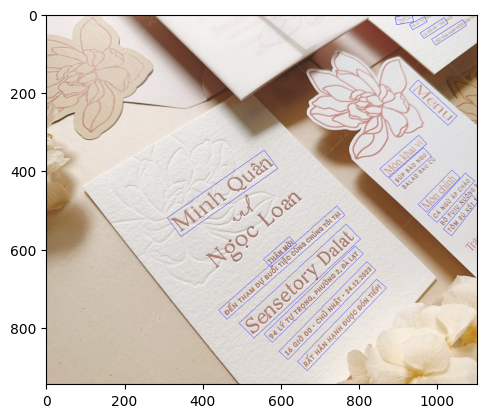

['Set', 'HÝ TƯ', 'T6 GIỜ C0 - CHỮ', 'ĐẤT HÂN HẠNH ĐƯỢC', 'Menu', 'Môn khai vị', 'SÚP BÀO NGƯ', 'Món chính', 'Minh Quân', 'CÁ NGỮ ÁP CHÂO', 'TÔM SÚ XỐT T', 'THÂN MỜI', 'ĐẾN THAM DỰ BUỔ TIỆC CÙNG CHÚNG TÔI TẠI', 'Sensetory Dalat', '94 LÝ TỰ TRỌNG, PHƯỜNG 2, ĐÀ LẠT', '16 GIỜ 00 - CHỦ NHẬT 24.12.2023', 'RẤT HÂN HẠNH ĐƯỢC ĐỐN TIẾP!']


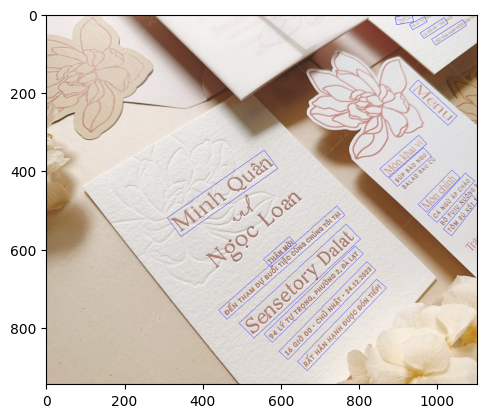

In [22]:
pipeline(_MODEL_c25_h32, '/kaggle/working/img_test.jpg')
pipeline(_MODEL_c40_h32, '/kaggle/working/img_test.jpg')

['Sel', 'Nứ TỰ', '16 GIỜ 00 CHÚ', 'SẤT HÂN HẠNH ĐƯỢC', 'Menu', 'Món khai vị', 'SÚP BÀO NGƯ', 'Món chính', 'Minh Quân', 'CÁ NGỪ ÁP CHẢO', 'TÔM SÚ XỐT T', 'THÂN MỜI', 'ĐẾN THAM DỰ BUỔI TIỆC CÙNG CHÚNG TÔI TẠI', 'Sensetory Dalat', '94 LÝ TỰ TRỌNG, PHƯỜNG 2, ĐÀ LẠT', '16 GIỜ 00 CHỦ NHẬT 24.12.2023', 'RẤT HÂN HẠNH ĐƯỢC ĐÓN TIẾP!']


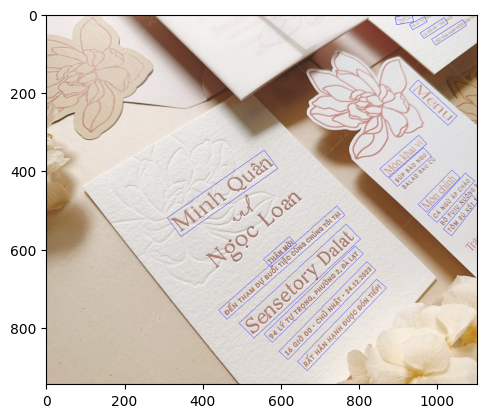

['Set', '34LÝ TỰ', '16 GIờ 00 - CHŨ', 'BẤT RÂN HẠNH ĐƯỢC', 'Menu', 'Món khai vị', 'SÚP BÀO NGƯ', 'Món chính', 'Minh Quân', 'CÁ NGỪ ÁP CHẢO', 'TÔM SÚ XỐT T', 'THÂN MỜI', 'ĐẾN THAM DỰ BUỔI TIỆC CÙNG CHÚNG TÔI TẠI', 'Sensetory Dalat', '94 LÝ TỰ TRỌNG, PHƯỜNG 2, ĐÀ LẠT', '16 GIỜ 00 CHỦ NHẬT 24.12.2023', 'RẤT HÂN HẠNH ĐƯỢC ĐÓN TIẾP!']


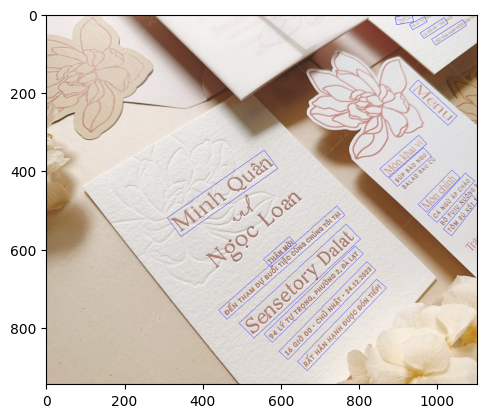

In [23]:
pipeline(_MODEL_c25_h48, '/kaggle/working/img_test.jpg')
pipeline(_MODEL_c40_h48, '/kaggle/working/img_test.jpg')

['Sei', 'SA LÝ TỰ', '16 0iỜ 00 CHỦI', 'ĐẤT ÂN HẠNH ĐƯỢC', 'Menu', 'Mon khai vị', 'SÚP BÀO NGƯ', 'Món chinh', 'Minh Quân', 'CÁ NGỪ ÁP CHẢO', 'TÔM SÚ XỐT T', 'THÂN MỜI', 'ĐẾN THAM DỰ BUỔI TIỆC CÙNG CHÚNG TÔI TẠI', 'Sensetory Dalat', '94 LÝ TỰ TRỌNG, PHƯỜNG 2, ĐÀ LẠT', '16 GIỜ 00 - CHỦ NHẬT 24. 12. 2023', 'RẤT HÂN HẠNH ĐƯỢC ĐÓN TIẾP!']


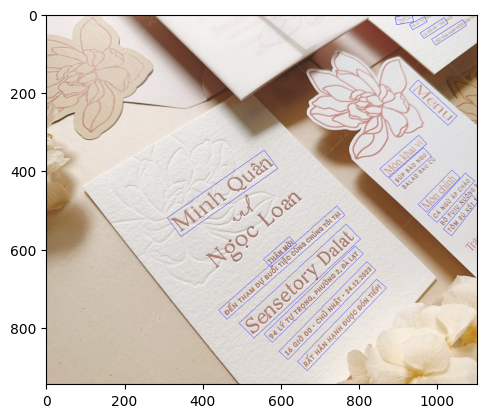

['Set', '34LÝ TỰ', '16 GiỞ 60 CHỦ', 'BẤT RÂN HẠNH ĐƯỢC', 'Menu', 'Món khai vị', 'SÚP BÀO NGƯ', 'Món chính', 'Minh Quân', 'CÁ NGỪ ÁP CHẢO', 'TÔM SÚ XỐT T', 'THÂN MỜI', 'ĐẾN THAM DỰ BUỔI TIỆC CÙNG CHÚNG TÔI TẠI', 'Sensetory Dalat', '94 LÝ TỰ TRỌNG, PHƯỜNG 2, ĐÀ LẠT', '16 GIỜ 00 CHỦ NHẬT 24.12.2023', 'RẤT HÂN HẠNH ĐƯỢC ĐÓN TIẾP!']


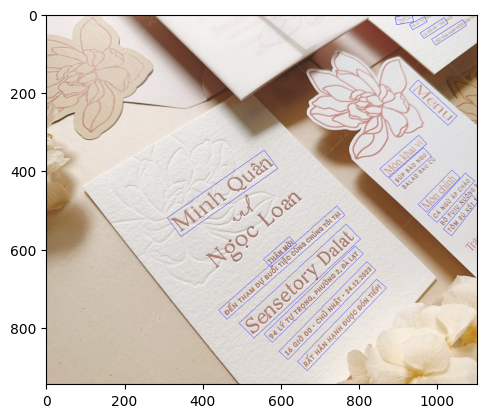

In [24]:
pipeline(_MODEL_c25_h64, '/kaggle/working/img_test.jpg')
pipeline(_MODEL_c40_h64, '/kaggle/working/img_test.jpg')

In [25]:
!wget -O img_test.jpg https://s1.giaibaitap123.com/img/2021/03/13/giu_gin_su_trong_sang_cua_tieng_viet_2r0d8z_022825.jpg

--2025-12-25 03:51:05--  https://s1.giaibaitap123.com/img/2021/03/13/giu_gin_su_trong_sang_cua_tieng_viet_2r0d8z_022825.jpg
Resolving s1.giaibaitap123.com (s1.giaibaitap123.com)... 188.114.97.0, 188.114.96.0, 2a06:98c1:3121::, ...
Connecting to s1.giaibaitap123.com (s1.giaibaitap123.com)|188.114.97.0|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 299172 (292K) [image/jpeg]
Saving to: ‘img_test.jpg’

img_test.jpg        100%[===================>] 292.16K   348KB/s    in 0.8s    

2025-12-25 03:51:06 (348 KB/s) - ‘img_test.jpg’ saved [299172/299172]



['GIỨ GÌN SƯ TRONG SÁNG CỦA TIẾNG VIỆT', 'KẾT QUẢ CẦN ĐẠT', '- Nhận thức được sự trong sáng của tiếng', 'meno.0se', 'Việt biểu hiện ở một số phương diện cơ bản', 'và là một yêu cầu đối với việc sử dụng', 'tiếng Việt.', '- Có ý thức, thói quen giữ gìn sự trong sáng', 'của tiếng Việt khi sử dụng luôn nâng cao', 'hiếu biết về tiếng Việt và rèn luyện các kĩ', 'năng sử dụng tiếng Việt.', 'I - SỤ TRONG SÁNG CỦA TIẾNG VIỆT', 'Như nhiều ngôn ngữ trên thế giới, trải qua hàng ngàn năm tồn tại và phát', 'triển, tiếng Việt đã đạt được phẩm chất trong sáng, nhưng yêu cầu giữ gìn sự', 'trong sáng vẫn luôn luôn cần đặt ra.', 'Sự trong sáng của tiếng Việt được biểu hiện qua một số phương diện cơ', 'bản sau:', '.', '1. Tiếng Việt có hệ thống chuẩn mực, quy tắc chung về phát âm, chữ viết,', 'về dùng từ, đặt câu, về cấu tạo lời nói, bài văn,. Những chuẩn mực, quy tắc', 'đó là cơ sở cho việc thể hiện rõ ràng, mạch lạc nội dung tư tưởng, tình cảm', 'của mỗi người và cho việc linh hội được đầy đủ, chính xác

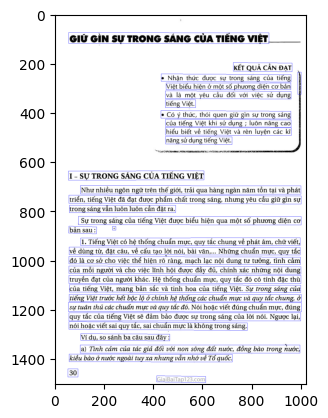

['GIỮ GÌN SỰ TRONG SÁNG CỦA TIẾNG VIỆT', 'KẾT QUẢ CẦN ĐẠT', '. Nhận thức được sự trong sáng của tiếng', 'ei9ses9.sTee0e', 'Việt biểu hiện ở một số phương diện cơ bản', 'và là một yêu cầu đối với việc sứử dụng', 'tiếng Việt,.', '. Có Ý thức, thói quen giữ gìn sự trong sáng', 'của tiếng Việt khi sử dụng luôn nâng cao', 'hiếu biết về tiếng Việt và rèn luyện các kĩ', 'năng sử dụng tiếng Việt.', 'I SỰ TRONG SÁNG CỦA TIẾNG VIỆT', 'Như nhiều ngôn ngữ trên thế gii, trải qua hàng ngàn năm tồn tại và phát', 'triển, tiếng Việt đã đạt được phẩm chất trong sáng, nhưng yêu cầu giữ gìn sự', 'trong sáng vẫn luôn luôn cần đặt ra.', 'Sự trong sáng của tiếng Việt được biểu hiện qua một số phương diện cơ', 'bản sau:', '.', '1. Tiếng Việt có hệ thống chuẩn mực, quy tắc chung về phát âm, chữ viết,', 'về dùng từ, đặt câu, về cấu tạo lời nói, bài văn,. Những chuẩn mực, quy tắc', 'đó là cơ sở cho việc thể hiện rõ ràng, mạch lạc nội dung tư tưởng, tình cảm', 'của mỗi người và cho việc linh hội được đầy đủ, chín

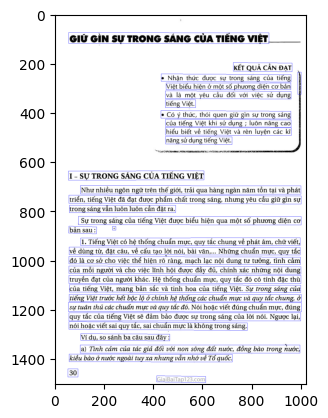

In [27]:
pipeline(_MODEL_c25_h32, '/kaggle/working/img_test.jpg')
pipeline(_MODEL_c40_h32, '/kaggle/working/img_test.jpg')

['GIỮ GÌN SỰ TRONG SÁNG CỦA TIẾNG VIỆT', 'KẾT QUẢ CẦN ĐẠT', '. Nhận thức được sự trong sáng của tiếng', 'pezee0cec.3tnzsce', 'Việt biểu hiện ở một số phương diện cơ bản', 'và là một yêu cầu đối với việc sử dụng', 'tiếng Việt.', '. Có ý thức, thói guen giữ gìn sự trong sáng', 'của tiếng Việt khi sử dụng : luôn nâng cao', 'hiểu biết về tiếng Việt và rèn luyện các kĩ', 'năng sử dụng tiếng Việt.', 'I - SỰ TRONG SÁNG CỦA TIẾNG VIỆT', 'Như nhiều ngôn ngữ trên thế giới, trải qua hàng ngàn năm tồn tại và phát', 'triển, tiếng Việt đã đạt được phẩm chất trong sáng, nhưng yêu cầu giữ gìn sự', 'trong sáng vẫn luôn luôn cần đặt ra.', 'Sự trong sáng của tiếng Việt được biểu hiện qua một số phương diện cơ', 'bản sau:', '.', '1. Tiếng Việt có hệ thống chuẩn mực, quy tắc chung về phát âm, chữ viết,', 'về dùng từ, đặt câu, về cấu tạo lời nói, bài văn, . Những chuẩn mực, guy tắc', 'đó là cơ sở cho việc thể hiện rõ ràng, mạch lạc nội dung tư tưởng, tình cảm', 'của mỗi người và cho việc lĩnh hội được đầy đ

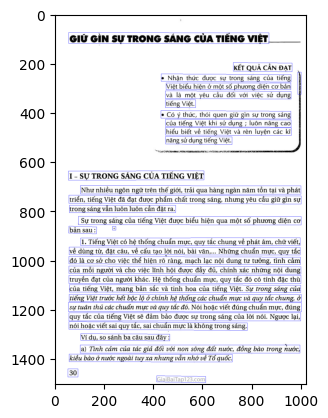

['GIỮ GÌN SỰ TRONG SÁNG CỦA TIẾNG VIỆT', 'KẾT QUẢ CẦN ĐẠT', '. Nhận thức được sự trong sáng của tiếng', 'PĐ990993.370900', 'Việt biểu hiện ở một số phương diện cơ bản', 'và là một yêu cầu đối với việc sứ dụng', 'tiếng Việt.', '. Có ý thức, thói guen giữ gìn sự trong sáng', 'của tiếng Việt khi sử dụng , luôn nâng cao', 'hiểu biết về tiếng Việt và rèn luyện các kĩ', 'năng sử dụng tiếng Việt.', 'I SỰ TRONG SÁNG CỦA TIẾNG VIỆT', 'Như nhiều ngôn ngữ trên thế giới, trải qua hàng ngàn năm tồn tại và phát', 'triển, tiếng Việt đã đạt được phẩm chất trong sáng, nhưng yêu cầu giữ gìn sự', 'trong sáng vẫn luôn luôn cần đặt ra.', 'Sự trong sáng của tiếng Việt được biểu hiện qua một số phương diện cơ', 'bản sau:', '.', '1. Tiếng Việt có hệ thống chuẩn mực, quy tắc chung về phát âm, chữ viết,', 'về dùng từ, đặt câu, về cấu tạo lời nói, bài văn, .. Những chuẩn mực, quy tắc', 'đó là cơ sở cho việc thể hiện rõ ràng, mạch lạc nội dung tư tưởng, tình cảm', 'của mỗi người và cho việc lĩnh hội được đầy đủ, 

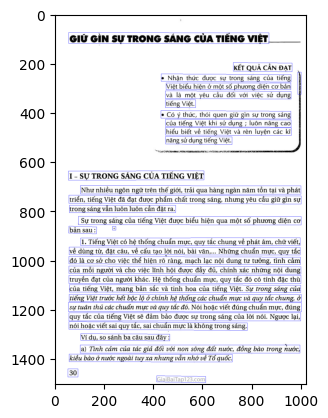

In [26]:
pipeline(_MODEL_c25_h48, '/kaggle/working/img_test.jpg')
pipeline(_MODEL_c40_h48, '/kaggle/working/img_test.jpg')

['GIỮ GÌN SƯ TRONG SÁNG CỦA TIẾNG VIỆT', 'KẾT QUẢ CẦN ĐẠT', ' Nhận thức được sự trong sáng của tiếng', 'asse0pacstnzR0c', 'Việt biểu hiện ở một số phương diện cơ bản', 'và là một yu cầu đối với việc sử dụng', 'tiếng Việt.', '- Có ý thức, thói guen giữ gìn sự trong sáng', 'của tiếng Việt khi sử dụng : luôn nâng cao', 'hiểu biết về tiếng Việt và rèn luyện các kĩ', 'năng sử dụng tiếng Việt.', 'I - SỰ TRONG SÁNG CỦA TIẾNG VIỆT', 'Như nhiều ngôn ngữ trên thế giới, trải qua hàng ngàn năm tồn tại và phát', 'triển, tiếng Việt đã đạt được phẩm chất trong sáng, nhưng yêu cầu giữ gìn sự', 'trong sáng vẫn luôn luôn cần đặt ra.', 'Sự trong sáng của tiếng Việt được biểu hiện qua một số phương diện cơ', 'bản sau:', '.', '1. Tiếng Việt có hệ thống chuẩn mực, quy tắc chung về phát âm, chữ viết,', 'về dùng từ, đặt câu, về cấu tạo lời nói, bài văn,  Những chuẩn mực, quy tắc', 'đó 1à cơ sở cho việc thể hiện rõ ràng, mạch lạc nội dung tư tưởng, tình cảm', 'của mỗi người và cho việc lĩnh hội được đầy đủ, ch

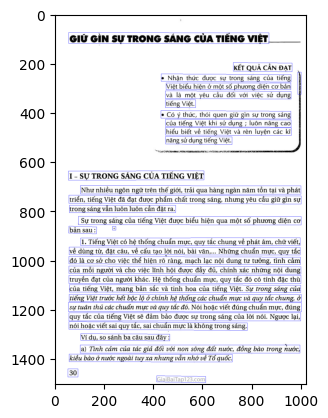

['GIỮ GÌN SỰ TRONG SÁNG CỦA TIẾNG VIỆT', 'KẾT QUẢ CẦN ĐẠT', '. Nhận thức được sự trong sáng của tiếng', 'a#0p9BBT90C', 'Việt biểu hiện ở một số phương diện cơ bản', 'và là một yêu cầu đối với việc sử dụng', 'tiếng Việt.', '. Có ý thức, thói quen giữ gìn sự trong sáng', 'của tiếng Việt khi sử dụng luôn nâng cao', 'hiểu biết về tiếng Việt và rèn luyện các kĩ', 'năng sử dụng tiếng Việt.', 'I - SỰ TRONG SÁNG CỦA TIẾNG VIỆT', 'Như nhiều ngôn ngữ trên thế giới, trải qua hàng ngàn năm tồn tại và phát', 'triển, tiếng Việt đã đạt được phẩm chất trong sáng, nhưng yêu cầu giữ gìn sự', 'trong sáng vẫn luôn luôn cần đặt ra.', 'Sự trong sáng của tiếng Việt được biểu hiện qua một số phương diện cơ', 'bản sau:', 'R', '1. Tiếng Việt có hệ thống chuẩn mực, quy tắc chung về phát âm, chữ viết,', 'về dùng từ, đặt câu, về cấu tạo hời nói, bài văn, . Những chuẩn mực, quy tắc', 'đó Ià cơ sở cho việc thể hiện rõ ràng, mạch lạc nội dung tư tưởng, tình cảm', 'của mỗi người và cho việc lĩnh hội được đầy đủ, chính

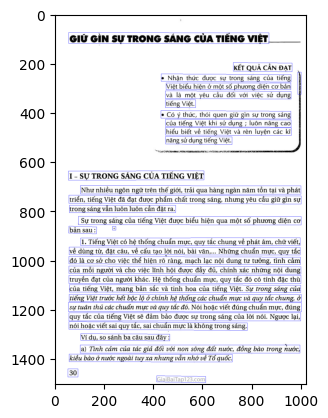

In [28]:
pipeline(_MODEL_c25_h64, '/kaggle/working/img_test.jpg')
pipeline(_MODEL_c40_h64, '/kaggle/working/img_test.jpg')

In [29]:
!wget -O img_test.jpg https://dichvudanhvanban.com/public/files/images/2022/05/12/hinh-dang-hinh-anh.jpg

--2025-12-25 03:56:19--  https://dichvudanhvanban.com/public/files/images/2022/05/12/hinh-dang-hinh-anh.jpg
Resolving dichvudanhvanban.com (dichvudanhvanban.com)... 103.221.221.8
Connecting to dichvudanhvanban.com (dichvudanhvanban.com)|103.221.221.8|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 133087 (130K) [image/jpeg]
Saving to: ‘img_test.jpg’

img_test.jpg        100%[===================>] 129.97K   182KB/s    in 0.7s    

2025-12-25 03:56:22 (182 KB/s) - ‘img_test.jpg’ saved [133087/133087]



['118 Secrets of the Milonaire Mind', 'TƯ DUY TRIỆU PHÚ SỐ 5', 'kết gué', 'Người giàu tập trung vào các co hội.', 'Việc ', 'Người nghèo tập trung vào nhúng', 'cho no', 'N', 'khó khăn.', 'thự tin', 'cũúng', 'được', 'Người giàu nhìn thấy các cơ hội. Người nghèo nhìn', 'V', 'thấy những khó khăn. Người giàu nhìn thấy tiềm năng', 'vi lú', 'tăng trưởng. Người nghèo nhìn thấy nguy cơ mất tiến.', 'sẫn', 'Người giàu tập trung vào tiêm năng lợi nhuận. Người', 'xấu', 'nghèo tập trung vào khả năng rủi ro.', 'Điều đó dẫn đến một câu hỏi từ xa xưa như thế này:', '"Cái ly đang đây một nửa hay đang vơi một nửa " Ở đây', 'tự t', 'chúng ta không nói đến việc suy nghĩ tích cực, chúng ta', 'ngh', 'chỉ bàn về quan điểm quen thuộc của bạn về thế giới.', 'là', 'Người nghèo lựa chọn dựa trên nỗi sợ hãi. Trí óc họ liên', 'kh', 'tục "tua lại" nhừng cảnh về những trở ngại hay những khó', 'hiệ', 'khăn, rủỉ ro đã hay có thể nảy sinh. Hướng suy nghi chủ', 'yếu trong đầu họ là: "Điều gì sè xảy ra nếu phương án này',

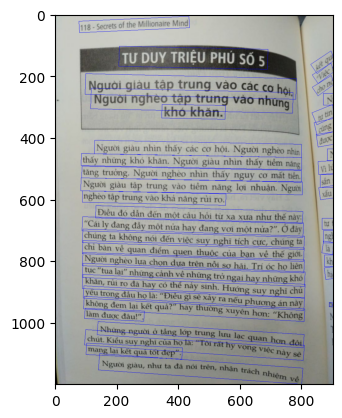

['118 Secrets of the Millionaire Mind', 'TƯ DUY TRIỆU PHÚ SỐ 5', 'kết gui', 'Người giàu tập trung vào các cơ hội.', 'Việc ', 'Người nghèo tập trung vào những', 'cho nó', 'N', 'khó khăn.', 'tự tin', 'cìng ', 'được', 'Người giàu nhìn thấy các cơ hội. Người nghèo nhìn', 'Z', 'thấy những khó khăn. Người giàu nhìn thấy tiềm năng', 'vi lú', 'tăng trưởng, Người nghèo nhìn thấy nguy cơ mất tiền.', 'sẫn', 'Người giàu tập trung vào tiềm năng lợi nhuận. Người', 'xấu', 'nghèo tập trung vào khả năng rủi ro.', 'Điều đó dẫn đến một câu hỏi từ xa xưa như thế này:', '"Cái ly đang đây một nửa hay đang vơi một nửa?". Ở đây', 'tự t', 'chúng ta không nói đến việc suy nghĩ tích cực, chúng ta', 'ngh', 'chỉ bàn về quan điểm quen thuộc của bạn về thế giới.', 'là', 'Người nghèo lựa chọn dựa trên nỗi sợ hãi. Trí óc họ liên', 'kh', 'tục "tua lại" nhừng cảnh về nhừng trở ngại hay những khó', 'hiể', 'khăn, rủi ro đã hay có thể nảy sinh. Hướng suy nghĩ chủ', 'yếu trong đầu họ là: "Điều gì sê xảy ra nếu phương án này

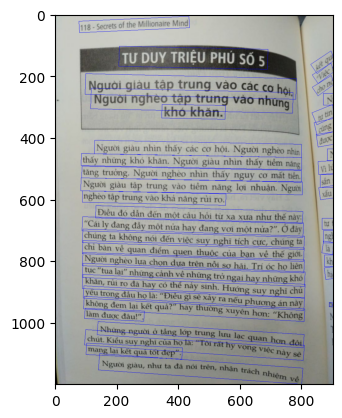

In [30]:
pipeline(_MODEL_c25_h48, '/kaggle/working/img_test.jpg')
pipeline(_MODEL_c40_h48, '/kaggle/working/img_test.jpg')

# Benchmark

In [4]:
def create_recognizer(height, width, model_dir):
    # assert height==32 or height==48 or height==64, "`height` must be in one of three choices: 32, 48, or 64"
    yml_path = os.path.join(model_dir, 'inference.yml')
    
    with open(yml_path, 'r') as file:
            infer_yml = yaml.safe_load(file)
            infer_yml['PreProcess']['transform_ops'][2]['RecResizeImg']['image_shape'] = [3, height, width]
    with open(yml_path, 'w') as file:
        yaml.dump(infer_yml, file)

    model =  TextRecognition(
        model_name="PP-OCRv5_mobile_rec",
        model_dir=model_dir
    )

    return model

In [5]:
# V3: dataset_word-textline; epoch_40; chars_25; eval_Test
model_dir_v3 = '/kaggle/working/v3/infer'

# V5: dataset_word-textline; epoch_40; chars_40; eval_Test
model_dir_v5 = '/kaggle/working/v5/infer'

In [6]:
def plot_benchmark_results(results, title="OCR Benchmark Comparison"):
    """
    results: dict like {
        "auto": {...},
        "h32": {...},
        "h48": {...},
        "h64": {...},
    }
    Each result dict must contain:
        - accuracy
        - mean_normalized_ed
    """

    names = list(results.keys())
    accuracy = [results[k]["accuracy"] for k in names]
    norm_ed  = [results[k]["mean_normalized_ed"] for k in names]

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # --- Left: Accuracy ---
    bars_acc = axes[0].bar(names, accuracy)
    axes[0].set_title("Accuracy (higher is better)")
    axes[0].set_ylim(0, 1)
    axes[0].set_ylabel("Accuracy")
    axes[0].grid(axis='y', linestyle='--', alpha=0.4)

    # Add text labels above bars
    for bar in bars_acc:
        height = bar.get_height()
        axes[0].text(
            bar.get_x() + bar.get_width()/2,
            height + 0.01,
            f"{height:.4f}",
            ha='center', va='bottom', fontsize=10
        )

    # --- Right: Normalized Edit Distance ---
    bars_ed = axes[1].bar(names, norm_ed, color='orange')
    axes[1].set_title("Normalized Edit Distance (lower is better)")
    axes[1].set_ylabel("Normalized ED")
    axes[1].set_ylim(0, max(norm_ed) * 1.3)
    axes[1].grid(axis='y', linestyle='--', alpha=0.4)

    # Add text labels
    for bar in bars_ed:
        height = bar.get_height()
        axes[1].text(
            bar.get_x() + bar.get_width()/2,
            height + (max(norm_ed) * 0.02),
            f"{height:.4f}",
            ha='center', va='bottom', fontsize=10
        )

    plt.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()

    if results.get("auto", False):
        from collections import Counter
        shape_counts = Counter(item["selected_shape"] for item in results["auto"]["log"])
        print("Auto selected shape counts:", dict(shape_counts))

In [7]:
FIXED_SIZES = [(320, 32), (320, 48), (320, 64)]

def edit_distance(gt, pred):
    return Levenshtein.distance(gt, pred)

def keep_sample(im_path, gt_text, min_chars, max_chars):
    if 'textline' in im_path and min_chars <= len(gt_text) <= max_chars:
        return True
    return False

def get_closest_fixed_size(original_shape):
    width, height = original_shape
    if height == 0:
        return FIXED_SIZES[0]
    
    def distortion(ts):
        tw, th = ts
        sx, sy = tw / width, th / height
        return max(sx / sy, sy / sx)

    return min(FIXED_SIZES, key=distortion)


# Main Benchmark
def benchmark(
    txt_label_dir='/kaggle/input/rec-merged-data/unseen_labels.txt',
    dataset_dir='/kaggle/input/rec-merged-data',
    model_map=None,
    target_height="auto",
    target_width=320,
    ratio_ED=0.08,
    min_chars=0,
    max_chars=float('inf')
):
    # assert target_height in ['auto', 32, 48, 64]
    # assert target_width in [320, 480]

    # Load list of images + labels
    im_paths, gt_texts = [], []
    with open(txt_label_dir, "r", encoding="utf-8") as f:
        for line in f:
            parts = line.rstrip("\n").split("\t")
            if len(parts) < 2:
                continue
            
            rel_im_path, text_gt = parts[0], parts[1]
            if keep_sample(rel_im_path, text_gt, min_chars, max_chars):
                im_paths.append(os.path.join(dataset_dir, rel_im_path))
                gt_texts.append(text_gt)

    # Prediction + Evaluation
    logs = []
    acc_list = []
    ed_list = []
    ed_norm_list = []

    loop_items = list(zip(im_paths, gt_texts))

    for img_path, text_gt in tqdm(loop_items, total=len(loop_items), desc=f"Benchmarking {txt_label_dir}"):

        if not os.path.exists(img_path):
            print(f"Missing: {img_path}")
            continue

        # Read image
        im = Image.open(img_path)
        w, h = im.size

        # Auto-select model input resolution
        selected_size = get_closest_fixed_size((w, h)) if target_height == "auto" else (target_width, target_height)
        model = model_map[selected_size]

        # Predict
        np_img = np.array(im)
        result = model.predict(np_img)
        pred_text = result[0]["rec_text"]
        pred_score = result[0]["rec_score"]

        # Edit Distance
        ed = edit_distance(text_gt, pred_text)
        max_ed = round(len(text_gt) * ratio_ED)
        is_good = (ed <= max_ed)

        acc_list.append(is_good)
        ed_list.append(ed)
        ed_norm_list.append(ed / max(1, len(text_gt)))  # normalized ED

        # Log
        logs.append({
            "im_path": img_path,
            "ground_truth": text_gt,
            "prediction": pred_text,
            "edit_distance": ed,
            "normalized_ed": ed / max(1, len(text_gt)),
            "threshold": max_ed,
            "is_good": is_good,
            "rec_score": round(pred_score,2),
            "selected_shape": selected_size,
        })

    # FINAL SCORE
    accuracy = sum(acc_list) / len(acc_list) if acc_list else 0.0

    mean_ed = statistics.mean(ed_list) if ed_list else 0
    median_ed = statistics.median(ed_list) if ed_list else 0
    mean_normalized_ed = statistics.mean(ed_norm_list) if ed_norm_list else 0

    return {
        "accuracy": round(accuracy, 4),
        "mean_edit_distance": round(mean_ed, 4),
        "median_edit_distance": round(median_ed, 4),
        "mean_normalized_ed": round(mean_normalized_ed, 4),
        "num_samples": len(logs),
        "log": logs,
    }

In [11]:
_rec_c25_h32 = create_recognizer(height=32, width=320, model_dir=model_dir_v3)
_rec_c25_h48 = create_recognizer(height=48, width=320, model_dir=model_dir_v3)
_rec_c25_h64 = create_recognizer(height=64, width=320, model_dir=model_dir_v3)

model_map_c25 = {
    (320, 32): _rec_c25_h32,
    (320, 48): _rec_c25_h48,
    (320, 64): _rec_c25_h64,
}

_rec_c40_h32 = create_recognizer(height=32, width=320, model_dir=model_dir_v5)
_rec_c40_h48 = create_recognizer(height=48, width=320, model_dir=model_dir_v5)
_rec_c40_h64 = create_recognizer(height=64, width=320, model_dir=model_dir_v5)

model_map_c40 = {
    (320, 32): _rec_c40_h32,
    (320, 48): _rec_c40_h48,
    (320, 64): _rec_c40_h64,
}

In [12]:
benchmark_c25_auto = benchmark(
    model_map=model_map_c25,
    target_height='auto',
    target_width=320,
    min_chars=40,
)

benchmark_c25_h32 = benchmark(
    txt_label_dir='/kaggle/input/rec-merged-data/unseen_labels.txt',
    dataset_dir='/kaggle/input/rec-merged-data',
    model_map=model_map_c25,
    target_height=32,
    target_width=320,
    ratio_ED=0.08,
    min_chars=40,
)

benchmark_c25_h48 = benchmark(
    model_map=model_map_c25,
    target_height=48,
    target_width=320,
    min_chars=40,
)

benchmark_c25_h64 = benchmark(
    model_map=model_map_c25,
    target_height=64,
    target_width=320,
    min_chars=40,
)

Benchmarking /kaggle/input/rec-merged-data/unseen_labels.txt: 100%|██████████| 120/120 [00:37<00:00,  3.21it/s]
Benchmarking /kaggle/input/rec-merged-data/unseen_labels.txt: 100%|██████████| 120/120 [00:37<00:00,  3.24it/s]
Benchmarking /kaggle/input/rec-merged-data/unseen_labels.txt: 100%|██████████| 120/120 [00:41<00:00,  2.90it/s]
Benchmarking /kaggle/input/rec-merged-data/unseen_labels.txt: 100%|██████████| 120/120 [00:46<00:00,  2.57it/s]


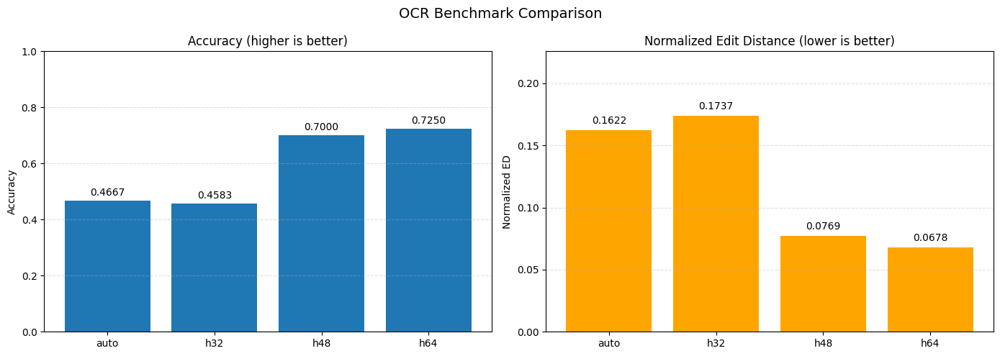

Auto selected shape counts: {(320, 32): 117, (320, 48): 3}


In [14]:
results = {
    "auto": benchmark_c25_auto,
    "h32": benchmark_c25_h32,
    "h48": benchmark_c25_h48,
    "h64": benchmark_c25_h64,
}

plot_benchmark_results(results)

In [15]:
benchmark_c40_auto = benchmark(
    model_map=model_map_c40,
    target_height='auto',
    target_width=320,
    min_chars=40,
)

benchmark_c40_h32 = benchmark(
    model_map=model_map_c40,
    target_height=32,
    target_width=320,
    min_chars=40,
)

benchmark_c40_h48 = benchmark(
    model_map=model_map_c40,
    target_height=48,
    target_width=320,
    min_chars=40,
)

benchmark_c40_h64 = benchmark(
    model_map=model_map_c40,
    target_height=64,
    target_width=320,
    min_chars=40,
)

Benchmarking /kaggle/input/rec-merged-data/unseen_labels.txt: 100%|██████████| 120/120 [00:37<00:00,  3.16it/s]
Benchmarking /kaggle/input/rec-merged-data/unseen_labels.txt: 100%|██████████| 120/120 [00:37<00:00,  3.19it/s]
Benchmarking /kaggle/input/rec-merged-data/unseen_labels.txt: 100%|██████████| 120/120 [00:42<00:00,  2.85it/s]
Benchmarking /kaggle/input/rec-merged-data/unseen_labels.txt: 100%|██████████| 120/120 [00:47<00:00,  2.52it/s]


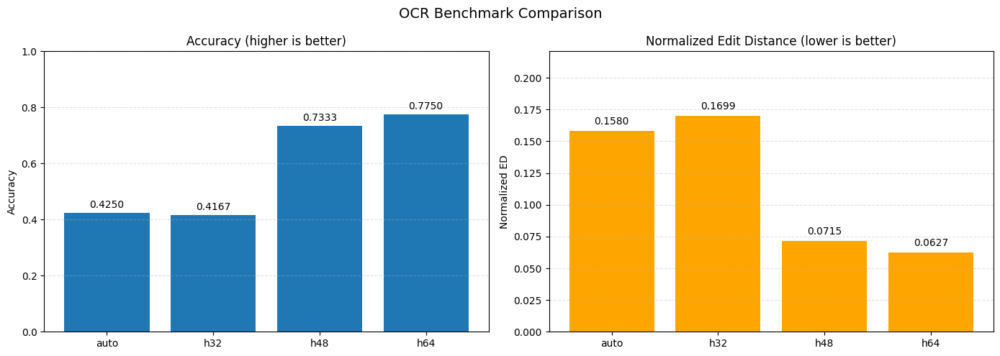

Auto selected shape counts: {(320, 32): 117, (320, 48): 3}


In [17]:
results = {
    "auto": benchmark_c40_auto,
    "h32": benchmark_c40_h32,
    "h48": benchmark_c40_h48,
    "h64": benchmark_c40_h64,
}

plot_benchmark_results(results)

In [18]:
_rec_c40_h64_w320 = create_recognizer(height=64, width=320, model_dir=model_dir_v5) # baseline

_rec_c40_h32_w480 = create_recognizer(height=32, width=480, model_dir=model_dir_v5)
_rec_c40_h48_w480 = create_recognizer(height=48, width=480, model_dir=model_dir_v5)
_rec_c40_h64_w480 = create_recognizer(height=64, width=480, model_dir=model_dir_v5)

_rec_c40_h32_w640 = create_recognizer(height=32, width=640, model_dir=model_dir_v5)
_rec_c40_h48_w640 = create_recognizer(height=48, width=640, model_dir=model_dir_v5)
_rec_c40_h64_w640 = create_recognizer(height=64, width=640, model_dir=model_dir_v5)

model_map = {
    (320, 64): _rec_c40_h64_w320,

    (480, 32): _rec_c40_h32_w480,
    (480, 48): _rec_c40_h48_w480,
    (480, 64): _rec_c40_h64_w480,

    (640, 32): _rec_c40_h32_w640,
    (640, 48): _rec_c40_h48_w640,
    (640, 64): _rec_c40_h64_w640,
}

benchmark_c40_h64_w320 = benchmark(model_map=model_map, target_height=64, target_width=320, min_chars=40)

benchmark_c40_h32_w480 = benchmark(model_map=model_map, target_height=32, target_width=480, min_chars=40)
benchmark_c40_h48_w480 = benchmark(model_map=model_map, target_height=48, target_width=480, min_chars=40)
benchmark_c40_h64_w480 = benchmark(model_map=model_map, target_height=64, target_width=480, min_chars=40)

benchmark_c40_h32_w640 = benchmark(model_map=model_map, target_height=32, target_width=640, min_chars=40)
benchmark_c40_h48_w640 = benchmark(model_map=model_map, target_height=48, target_width=640, min_chars=40)
benchmark_c40_h64_w640 = benchmark(model_map=model_map, target_height=64, target_width=640, min_chars=40)

Benchmarking /kaggle/input/rec-merged-data/unseen_labels.txt: 100%|██████████| 120/120 [00:47<00:00,  2.55it/s]
Benchmarking /kaggle/input/rec-merged-data/unseen_labels.txt: 100%|██████████| 120/120 [00:36<00:00,  3.31it/s]
Benchmarking /kaggle/input/rec-merged-data/unseen_labels.txt: 100%|██████████| 120/120 [00:41<00:00,  2.86it/s]
Benchmarking /kaggle/input/rec-merged-data/unseen_labels.txt: 100%|██████████| 120/120 [00:47<00:00,  2.51it/s]
Benchmarking /kaggle/input/rec-merged-data/unseen_labels.txt: 100%|██████████| 120/120 [00:35<00:00,  3.38it/s]
Benchmarking /kaggle/input/rec-merged-data/unseen_labels.txt: 100%|██████████| 120/120 [00:40<00:00,  2.93it/s]
Benchmarking /kaggle/input/rec-merged-data/unseen_labels.txt: 100%|██████████| 120/120 [00:47<00:00,  2.55it/s]


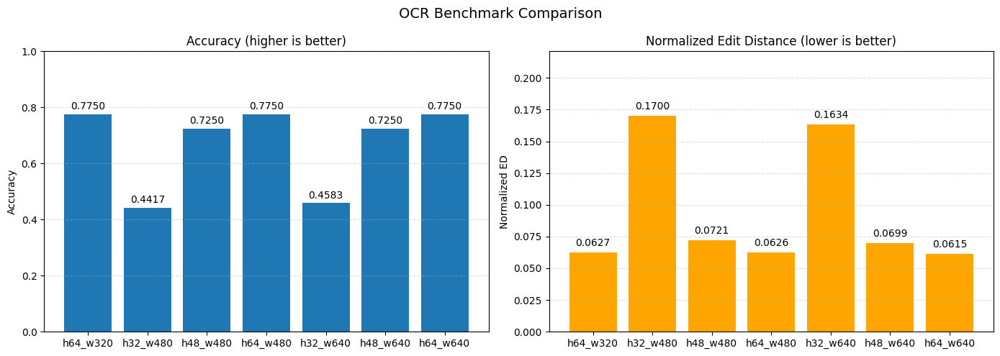

In [19]:
results = {
    "h64_w320": benchmark_c40_h64_w320,

    "h32_w480": benchmark_c40_h32_w480,
    "h48_w480": benchmark_c40_h48_w480,
    "h64_w480": benchmark_c40_h64_w480,

    "h32_w640": benchmark_c40_h32_w640,
    "h48_w640": benchmark_c40_h48_w640,
    "h64_w640": benchmark_c40_h64_w640,
}

plot_benchmark_results(results)